# Predicting an Ideal Fast Food Location

# Overview

In our project, we initially set out to analyze the effect of income, health index, and the percentage of people who drive to work on the location of fast food restaurants. The results of our analysis could be useful for owners of fast food restaurants in deciding where they should expand their fast food business and if there could be a possible marketing strategy that stems from those 3 factors. We used a multi-output regression model to predict a latitude and longitude from the three factors and found that they were not significant predictors of an ideal fast food restaurant location. However, considering that we had many limitations, like missing data, our project can be a guide for future studies on similar topics.

# Names

- Kathy Quach
- Vivian Tang
- Jill Su
- Victor Ung

# Research Question

Considering the median income, percentage of people who drive cars to work, and health index of a city, can we predict the ideal location we would recommend for the next fast food restaurant to open in Califorina?

## Background and Prior Work

Our group chose this question because we wanted to determine if there was a correlation between the location of fast food restaurants and income, percentage of people who drive cars to work, and the health index of a city. As college students, fast food tends to be a popular choice for those of us who want a cheap, quick meal without much effort. We wanted to see what other demographics this was true for as well. We initially looked at population density and housing value as our factors, but the results were too highly correlated with fast food restaurant locations, so we revised our question to focus on income, transportation data, and health index.

This study could be relevant to fast food chains that are interested in setting up more establishments in areas where fast food thrives. While researching on our topic, we found that companies use geographic information systems to compare traffic, consumer demographics, safety regulations, and many more to determine the best place to open up [1]. We picked some more specific factors to find out if there were trends in those as well. We found that drive thru windows generated the majority of most fast food chains’ business [2], so we chose to analyze whether a greater number of people driving cars to work was correlated with more fast food restaurants. We were also curious whether income would affect this trend. Initially, we thought that fast food restaurants would cluster around poorer neighborhoods, but according to a few articles we read, the middle class generally consumes more fast food than the working class [3].

Another similar study was conducted to observe the connection between fast food restaurant density, race and ethnicity, and income [4]. They used multiple regression to conclude that there was a link between these factors since predominantly black communities had 2.4 fast food restaurants per square mile compared to the 1.5 of predominantly white communities. They also noticed that fast food restaurant density was independently correlated to income and the percent of black residents. From their conclusions, we could also apply the multiple regression model to determine the correlation between the factors that we have chosen.

References: 

1. https://www.fastcompany.com/3034792/how-fast-food-chains-pick-their-next-location
2. https://www.restaurantbusinessonline.com/financing/despite-efforts-ban-them-drive-thrus-remain-popular
3. https://www.vox.com/the-goods/2018/10/24/18018544/fast-food-cdc-class-rich-people
4. https://www.ajpmonline.org/article/S0749-3797(04)00139-4/fulltext


# Hypothesis


We believe that there is a strong correlation between cities with lower health index, a greater percentage of people who drive cars to work, and lower median income with having a greater number of fast food restaurants. Therefore, we should be able to predict these areas as ideal locations for opening fast food restaurants.

# Dataset(s)

#### Cities in California
- Dataset Name: **Cities in California**
- Link to the dataset: https://en.wikipedia.org/wiki/List_of_cities_and_towns_in_California
- Number of observations: 482
- Description: This dataset contains the list of all cities in California.

#### Health Index Score Dataset
- Dataset Name: **hpi.csv**
- Link to the dataset: https://map.healthyplacesindex.org/
- Number of observations: 8057
- Description: This dataset gives the health index of each city in California.

#### Census of California Dataset
- Dataset Name: **census_data.csv**
- Link to the dataset: https://www.kaggle.com/goldenoakresearch/us-household-income-stats-geo-locations?select=kaggle_income.csv
- Number of observations: 74001
- Description: This dataset has the median household income for each city in California.

#### Transportation Dataset
- Dataset Name: **transportation.xlsx**
- Link to the dataset: https://data.ca.gov/dataset/transportation-to-work/resource/363b115e-787b-42e3-bc27-ee9d8c89fe94
- Number of observations: 202203
- Description: This dataset provides the percent of those who drive to work per city in California.

#### Yelp Dataset
- Dataset Name: **restaurant_location.csv**
- Link to dataset: https://www.yelp.com/developers/documentation/v3/business_search (API used)
- Number of observations: 9543
- Description: This dataset will contain all fast food restaurants in California generated from the Yelp API.

#### City and County Boundaries Dataset
- Dataset Name: **City_and_County_Boundaries.geojson**
- Link to dataset: https://gis.data.ca.gov/datasets/CDTFA::city-and-county-boundaries/geoservice?orderBy=CITY&page=26&selectedAttribute=Shape_Area
- Number of observations: 1580
- Description: This dataset will contain all city and county boundaries in California.

We are planning on extracting the columns with the list of city names from webscraping the Wikipedia page. Then, we can combine our other datasets (health index, median household income, and drive to work percentage) into a single dataframe so that we have all the information about a particular city in California. We are also using data from Yelp and California's city and county boundaries to plot the locations of fast food restaurants.

# Setup

In [1]:
import pandas as pd
import numpy as np
import json
import requests
import bs4
from bs4 import BeautifulSoup 
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import random
import shapely.geometry as shp

import patsy
import statsmodels.api as sm

import sklearn
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor

import seaborn as sns
pd.set_option('precision', 2)

# Data Cleaning

## Scrape Cities in California From Wikipedia

In order for us to use the YELP API to get information about individual fast food restaurants in California, we need to get the list of all cities in California to pass in as parameters. We also need to have information about which county each city resides in for our map visualizations later on. To achieve this, we scraped a Wikipedia page which contained both of these information.

In [2]:
wiki = 'https://en.wikipedia.org/wiki/List_of_cities_and_towns_in_California#:~:text=California%20is%20divided%20into%2058,is%20a%20consolidated%20city%2Dcounty.'
page = requests.get(wiki)
soup = BeautifulSoup(page.content, 'html.parser')

In [3]:
# Scrapes Wikipedia table to get information about each city in California
right_table = soup.find('table', class_ = 'wikitable plainrowheaders sortable')
cities = pd.read_html(str(right_table))
cities = pd.DataFrame(cities[0])
# Renames the columns of the table
cities.columns = ['City', 'Type', 'County', 'Population', 'Sq. Miles', 'Km2', 'Incorporated']
cities.head()

,City,Type,County,Population,Sq. Miles,Km2,Incorporated
0,Adelanto,City,San Bernardino,31765,56.01,145.1,"December 22, 1970"
1,Agoura Hills,City,Los Angeles,20330,7.79,20.2,"December 8, 1982"
2,Alameda,City,Alameda,73812,10.61,27.5,"April 19, 1854"
3,Albany,City,Alameda,18539,1.79,4.6,"September 22, 1908"
4,Alhambra,City,Los Angeles,83089,7.63,19.8,"July 11, 1903"


In [4]:
# Observe number of counties in California
print("There are", len(cities['County'].unique()),"COUNTY_Codes")

There are 55 COUNTY_Codes


In [5]:
# Get only City and County columns
cities = cities.drop(['Type', 'Population', 'Sq. Miles', 'Km2', 'Incorporated'], axis = 1)
cities.set_index('City')
cities.head()

,City,County
0,Adelanto,San Bernardino
1,Agoura Hills,Los Angeles
2,Alameda,Alameda
3,Albany,Alameda
4,Alhambra,Los Angeles


## Wrangling Health Index Per City Dataset
Using the dataset we found for health index of each city in California, we need to clean the data so that we can use it in our analysis.

In [6]:
# Obtain health indedx score of each city
healthy_places = pd.read_csv('hpi.csv')
healthy_places.head()

,hpi2score,hpi2_pctile,city,county_fips,county_name,geoid,hpi_top25pct,pct2010gq,pop2010,quartiles,...,transportation,transportation_pctile,treecanopy,treecanopy_pctile,twoparents,twoparents_pctile,uncrowded,uncrowded_pctile,voting,voting_pctile
0,-0.12,42.64,NaN,6065,Riverside,6065042744,NaN,0.4,3726,3.0,...,1.00e-03,48.67,1.43,1.92,86.00,75.22,81.2,15.45,64.59,37.19
1,0.33,70.14,French Valley,6065,Riverside,6065043240,NaN,0.0,8802,2.0,...,8.87e-02,65.30,2.03,4.93,87.45,79.05,95.8,58.75,68.40,48.72
2,NaN,NaN,Palm Springs,6065,Riverside,6065044807,NaN,0.0,1281,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,Palm Desert,6065,Riverside,6065045116,NaN,0.0,1492,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.28,66.94,NaN,6065,Riverside,6065045125,NaN,0.0,3017,2.0,...,-2.34e-02,44.58,3.10,15.35,100.00,99.56,100.0,96.93,75.78,74.23


In [7]:
# Drop columns that are not related to health index
healthy_places.drop(healthy_places.iloc[:, 5:], inplace = True, axis = 1)
healthy_places.head()

,hpi2score,hpi2_pctile,city,county_fips,county_name
0,-0.12,42.64,NaN,6065,Riverside
1,0.33,70.14,French Valley,6065,Riverside
2,NaN,NaN,Palm Springs,6065,Riverside
3,NaN,NaN,Palm Desert,6065,Riverside
4,0.28,66.94,NaN,6065,Riverside


#### Wrangling Health Index DataFrame
In the dataset, we drop rows where there is missing data for hpi2score, hpi2_pctile, and city name because this is the data we are interested in. If it is missing, we are unable to determine the health index of a particular city.

In [8]:
# Drop nan values from hpi2score and hpi2_pctile
healthy_places = healthy_places.dropna(subset=['hpi2score', 'hpi2_pctile'])
healthy_places.head()

,hpi2score,hpi2_pctile,city,county_fips,county_name
0,-0.12,42.64,NaN,6065,Riverside
1,0.33,70.14,French Valley,6065,Riverside
4,0.28,66.94,NaN,6065,Riverside
6,-0.37,27.35,Indio,6065,Riverside
7,0.32,69.61,Indio,6065,Riverside


In [9]:
# Drop rows that have NaN cities
dfcity = healthy_places.dropna(subset=['city'])
dfcity = dfcity.reset_index(drop = True)
dfcity.head()

,hpi2score,hpi2_pctile,city,county_fips,county_name
0,0.33,70.14,French Valley,6065,Riverside
1,-0.37,27.35,Indio,6065,Riverside
2,0.32,69.61,Indio,6065,Riverside
3,-0.24,35.24,Glendale,6037,Los Angeles
4,-0.95,3.76,Sacramento,6067,Sacramento


#### Group the cities to get the mean Health Score of the city
In our dataset, we currently have the health index of different regions within the city. We want to have one average health index that is representative of that entire city so here we take the average of our values. Some of the city names in this dataset is a bit different from our Wikipedia dataset so we need to rename it so that they match. 

In [10]:
hpi2score_city = dfcity.groupby(['city']).apply(lambda x: x['hpi2score'].sum()/len(x)).reset_index(name='hpi2score')
hpi2score_city.columns = ['City', 'Health Score']

hpi2score_city['City'].replace({"Angels": "Angels Camp", 
                                     "El Paso de Robles (Paso Robles)": "Paso Robles", 
                                     "San Buenaventura (Ventura)" : "Ventura"}, inplace=True)
hpi2score_city.at[308, 'City'] = "La Cañada Flintridge"
hpi2score_city.head()

,City,Health Score
0,Acton,0.20
1,Adelanto,-0.94
2,Agoura Hills,0.56
3,Agua Dulce,0.41
4,Alameda,0.48


#### Obtain Missing Health Scores
In our csv file that we downloaded from the website to get our data, it had some missing values. Therefore, we had to manually go to the same website to get that data ourselves.

In [11]:
missing_cities = pd.read_csv('missing_hpi2.csv')
missing_cities.columns = ['City', 'Health Score']
missing_cities.head()

,City,Health Score
0,Alturas,-0.30
1,Amador City,0.10
2,Avenal,-0.71
3,Biggs,-0.21
4,Blue Lake,0.10


In [12]:
# Add data for missing cities in manually
hpi2score_city = hpi2score_city.append(missing_cities)
hpi2score_city = hpi2score_city.sort_values('City', ascending = True)
hpi2score_city = hpi2score_city.reset_index(drop = True)
hpi2score_city

,City,Health Score
0,Acton,0.20
1,Adelanto,-0.94
2,Agoura Hills,0.56
3,Agua Dulce,0.41
4,Alameda,0.48
...,...,...
780,Yountville,0.43
781,Yreka,-0.25
782,Yuba City,-0.36
783,Yucaipa,-0.33


## Wrangling Census Dataset (Income)
From the data we obtained from the Census of 2010, we need to clean the data so that we only get the median income per household so that we can use it for our analysis later on.

In [13]:
census = pd.read_csv('census_data.csv')
census.head()

,STUSAB,SUMLEVEL,STATE_Code,COUNTY_Code,state,ALand,AWater,lat,lng,NCESSCH,...,hc_mortgage_median,hc_mean,hc_median,home_equity_second_mortgage,second_mortgage,home_equity,debt,hs_degree,hs_degree_male,hs_degree_female
0,AL,140,1,1,AL,9809938,36312,32.48,-86.49,10024000049,...,1223.0,376.01,354.0,0.01,0.01,0.08,0.61,0.85,0.78,0.91
1,AL,140,1,1,AL,3341886,5968,32.48,-86.47,10024000049,...,1082.0,294.06,295.0,0.02,0.02,0.09,0.62,0.75,0.65,0.82
2,AL,140,1,1,AL,5349273,9054,32.47,-86.46,10024000051,...,969.0,368.11,364.0,0.04,0.04,0.11,0.63,0.89,0.91,0.88
3,AL,140,1,1,AL,6382707,16244,32.47,-86.44,10024000587,...,1005.0,370.97,367.0,0.05,0.05,0.10,0.63,0.88,0.90,0.86
4,AL,140,1,1,AL,11399989,46159,32.46,-86.42,10024000546,...,1251.0,395.38,353.0,0.07,0.07,0.15,0.70,0.96,0.96,0.96


In [14]:
# Drop rows to only get California
ca_df = census.loc[census['STUSAB'] == 'CA']
ca_df = ca_df.reset_index(drop = True)
ca_df

,STUSAB,SUMLEVEL,STATE_Code,COUNTY_Code,state,ALand,AWater,lat,lng,NCESSCH,...,hc_mortgage_median,hc_mean,hc_median,home_equity_second_mortgage,second_mortgage,home_equity,debt,hs_degree,hs_degree_male,hs_degree_female
0,CA,140,6,1,CA,6894340,0,37.87,-122.23,62805004273,...,3863.0,1180.40,1162.0,6.36e-03,6.36e-03,0.19,0.70,0.98,0.98,0.99
1,CA,140,6,1,CA,587450,0,37.85,-122.25,62805004250,...,3028.0,734.77,718.0,7.56e-03,7.56e-03,0.21,0.77,0.99,0.98,0.99
2,CA,140,6,1,CA,1105328,0,37.84,-122.25,62805004250,...,3138.0,576.97,564.0,1.18e-02,1.18e-02,0.19,0.81,0.95,0.95,0.95
3,CA,140,6,1,CA,714729,0,37.85,-122.26,62805004307,...,2802.0,680.77,612.0,0.00e+00,0.00e+00,0.12,0.73,0.94,0.95,0.93
4,CA,140,6,1,CA,590307,0,37.85,-122.26,62805011558,...,2575.0,693.76,700.0,7.12e-02,7.12e-02,0.19,0.88,0.97,0.97,0.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8052,CA,140,6,115,CA,109398673,128316,39.04,-121.43,64233006928,...,1592.0,429.49,399.0,3.19e-02,8.48e-02,0.10,0.79,0.85,0.83,0.86
8053,CA,140,6,115,CA,254981318,4484791,39.19,-121.36,62409003622,...,1530.0,506.23,515.0,3.65e-02,3.65e-02,0.16,0.67,0.82,0.79,0.85
8054,CA,140,6,115,CA,101944651,240059,39.13,-121.39,64233011548,...,968.0,NaN,NaN,0.00e+00,0.00e+00,0.00,1.00,0.94,0.94,0.94
8055,CA,140,6,115,CA,468792917,6858527,39.27,-121.45,62409003622,...,1941.0,516.13,460.0,7.23e-02,7.23e-02,0.13,0.61,0.92,0.89,0.95


In [15]:
# Look at columns in our dataset
census.columns

Index(['STUSAB', 'SUMLEVEL', 'STATE_Code', 'COUNTY_Code', 'state', 'ALand',
       'AWater', 'lat', 'lng', 'NCESSCH', 'GEOID', 'county', 'coubsum',
       'place', 'MZIP', 'area_code', 'MCITY', 'pct_own', 'median_age',
       'divorced', 'Unemployed', 'not_labor_force', 'hi_median_df',
       'hs_degree_df', 'm_age_median', 'f_age_median', 'm_divorced',
       'f_divorced', 'primary', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'hi_mean', 'family_mean', 'family_median',
       'hc_mortgage_mean', 'hc_mortgage_median', 'hc_mean', 'hc_median',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'hs_degree', 'hs_degree_male', 'hs_degree_female'],
      dtype='object')

#### Drop missing columns and obtain data for those missing columns
The data we obtained contains missing values for family median income because the census does not provide information for cities where the population is less than 5000. Therefore, we had to use another dataset to obtain this information because our analysis will require that we have a median income for each city and no values can be missing. The dataset also provides median income based on certain regions in a given city so we take the average of those values to get one median income to represent that city. 

In [16]:
# Drop columns to get City name and family median income
ca_num = ca_df[['MCITY','family_median']]
ca_num.columns = ['City', 'Median Household Income']

# Drop missing values from family_median
ca_num = ca_num.dropna(subset=['Median Household Income'])
ca_num = ca_num.sort_values('City')
ca_num = ca_num.reset_index(drop = True)

In [17]:
city_family_median_income = ca_num.groupby(['City']).apply(lambda x: x['Median Household Income'].sum()/len(x)).reset_index(name='Median Household Income')
city_family_median_income.head()

,City,Median Household Income
0,Acampo,77645.00
1,Acton,108585.00
2,Adelanto,30813.33
3,Agoura,113073.00
4,Agua Dulce,164056.50


In [18]:
# Replace names to match Wikipedia City Name
city_family_median_income['City'].replace({'Agoura': 'Agoura Hills',
                                           'Carmel': 'Carmel-by-the-Sea',
                                           'City Of Commerce': 'Commerce', 
                                           'Famersville': 'Farmersville',
                                           'City Of Industry': 'Industry',
                                           'La Canada': 'La Cañada Flintridge', 
                                           'La Habra': 'La Habra Heights', 
                                           'Mcfarland': 'McFarland', 
                                           'Shasta': 'Shasta Lake'},
                                          inplace=True)


In [19]:
# Obtain missing family median income values
missing_median_income = pd.read_csv('missing_income.csv')
missing_median_income.columns = ['City', 'Median Household Income']
missing_median_income

,City,Median Household Income
0,Amador City,61198.0
1,Belvedere,223182.0
2,Biggs,52727.0
3,Bradbury,154000.0
4,Buellton,83023.0
5,Calipatria,35842.0
6,Canyon Lake,97237.0
7,Colfax,49571.0
8,Del Rey Oaks,90795.0
9,Ferndale,49750.0


In [20]:
# Combine the two family median income datasets together
city_family_median_income = city_family_median_income.append(missing_median_income)
city_family_median_income = city_family_median_income.sort_values('City', ascending = True)
city_family_median_income = city_family_median_income.reset_index(drop = True)
city_family_median_income.head()

,City,Median Household Income
0,Acampo,77645.00
1,Acton,108585.00
2,Adelanto,30813.33
3,Agoura Hills,113073.00
4,Agua Dulce,164056.50


## Wrangling Transportation Dataset
We are interested in the percentage of people who drive to work in a given city. We will use our dataset that we obtained below and clean the data so that it fits into our analysis.

In [21]:
cars_to_work = pd.read_excel('./transportation.xlsx')
cars_to_work

,ind_id,ind_definition,reportyear,race_eth_code,race_eth_name,geotype,geotypevalue,geoname,county_name,county_fips,...,pop_total,pop_mode,percent,LL95CI_percent,UL95CI_percent,percent_se,percent_rse,CA_decile,CA_RR,version
0,42,Percent of residents mode of transportation to...,2000,1.0,AIAN,CA,6.0,California,NaN,NaN,...,7.36e+04,2.41e+03,3.28,NaN,NaN,NaN,NaN,NaN,0.86,2013-12-12 15:40:44
1,42,Percent of residents mode of transportation to...,2000,2.0,Asian,CA,6.0,California,NaN,NaN,...,1.63e+06,4.29e+04,2.62,NaN,NaN,NaN,NaN,NaN,0.68,2013-12-12 15:40:44
2,42,Percent of residents mode of transportation to...,2000,3.0,AfricanAm,CA,6.0,California,NaN,NaN,...,7.98e+05,2.13e+04,2.68,NaN,NaN,NaN,NaN,NaN,0.70,2013-12-12 15:40:44
3,42,Percent of residents mode of transportation to...,2000,4.0,Latino,CA,6.0,California,NaN,NaN,...,3.87e+06,7.52e+04,1.95,NaN,NaN,NaN,NaN,NaN,0.51,2013-12-12 15:40:44
4,42,Percent of residents mode of transportation to...,2000,5.0,NHOPI,CA,6.0,California,NaN,NaN,...,4.29e+04,1.09e+03,2.54,NaN,NaN,NaN,NaN,NaN,0.66,2013-12-12 15:40:44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202198,42,Percent of residents mode of transportation to...,2008-2010,9.0,Total,RE,14.0,Southern California,NaN,NaN,...,7.89e+06,9.38e+05,11.89,11.75,12.03,0.07,0.60,NaN,1.02,2013-12-12 15:40:44
202199,42,Percent of residents mode of transportation to...,2008-2010,9.0,Total,RE,14.0,Southern California,NaN,NaN,...,7.89e+06,6.78e+06,85.92,85.80,86.04,0.06,0.43,NaN,1.02,2013-12-12 15:40:44
202200,42,Percent of residents mode of transportation to...,2008-2010,9.0,Total,RE,14.0,Southern California,NaN,NaN,...,7.89e+06,3.92e+05,4.97,4.88,5.06,0.05,0.94,NaN,0.96,2013-12-12 15:40:44
202201,42,Percent of residents mode of transportation to...,2008-2010,9.0,Total,RE,14.0,Southern California,NaN,NaN,...,7.89e+06,1.95e+05,2.47,2.39,2.55,0.04,1.71,NaN,0.89,2013-12-12 15:40:44


In [22]:
# See all columns in the dataframe
cars_to_work.columns

Index(['ind_id', 'ind_definition', 'reportyear', 'race_eth_code',
       'race_eth_name', 'geotype', 'geotypevalue', 'geoname', 'county_name',
       'county_fips', 'region_name', 'region_code', 'mode', 'mode_name',
       'pop_total', 'pop_mode', 'percent', 'LL95CI_percent', 'UL95CI_percent',
       'percent_se', 'percent_rse', 'CA_decile', 'CA_RR', 'version'],
      dtype='object')

#### Clean up the dataframe
We will need to clean the dataframe to only extract the columns that are needed for our analysis. The current dataframe provides data for different geography types but the only one we are interested in is **PL** because it refers to city while others refer to region/state. The dataset also contains information about census designated locations but we are only interested in cities so we can drop them as well. In our analysis, we only care about the percentage of peoople who drive to work so we can also exclude all other values.

In [23]:
cars_to_work = cars_to_work[['geotype', 'geoname', 'mode', 'percent']]
cars_to_work.columns = ['Geography Type', 'City', 'Mode of Transportation', 'Drive Percentage']
cars_to_work.head()

,Geography Type,City,Mode of Transportation,Drive Percentage
0,CA,California,ATHOME,3.28
1,CA,California,ATHOME,2.62
2,CA,California,ATHOME,2.68
3,CA,California,ATHOME,1.95
4,CA,California,ATHOME,2.54


In [24]:
# Keep rows where the geotype is a 'PL'
cars_to_work = cars_to_work.loc[cars_to_work['Geography Type'] == 'PL']
cars_to_work = cars_to_work.reset_index(drop = True)
cars_to_work.head()

,Geography Type,City,Mode of Transportation,Drive Percentage
0,PL,Acalanes Ridge CDP,ATHOME,NaN
1,PL,Acalanes Ridge CDP,BICYCLE,NaN
2,PL,Acalanes Ridge CDP,CAR,NaN
3,PL,Acalanes Ridge CDP,CARPOOL,NaN
4,PL,Acalanes Ridge CDP,CARTOTAL,NaN


In [25]:
# Keep rows where the mode of transportation is a car ('CAR')
cars_to_work = cars_to_work.loc[cars_to_work['Mode of Transportation'] == 'CAR']
#Drop Census Designated Places
cars_to_work = cars_to_work[~cars_to_work['City'].str.contains('CDP')]
cars_to_work = cars_to_work.reset_index(drop = True)
cars_to_work = cars_to_work[['City', 'Drive Percentage']]
cars_to_work.head()

,City,Drive Percentage
0,Adelanto city,70.29
1,Adelanto city,68.27
2,Adelanto city,74.02
3,Adelanto city,70.63
4,Adelanto city,70.49


#### Finding percent of people who drive to work
Our dataframe currently has the average percentage of people who drive to work across different years and we are looking for one single value. Therefore, we take the mean to get a single value to represent the percentage of those who drive to work. Some cities did not provide this information so we had to drop the rows with missing values. Later on, we had to manually find those missing values because our analysis requires this data.

In [26]:
cars_to_work = cars_to_work.groupby(cars_to_work['City']).mean()
cars_to_work = cars_to_work.reset_index()
cars_to_work = cars_to_work.dropna()
cars_to_work = cars_to_work.reset_index(drop = True)
cars_to_work.head()

,City,Drive Percentage
0,Adelanto city,69.69
1,Agoura Hills city,81.68
2,Alameda city,62.32
3,Albany city,49.05
4,Alhambra city,76.26


In [27]:
# Remove all 'CDP' and 'city' from names of cities
cars_to_work['City'] = cars_to_work['City'].str.replace(' CDP','')
cars_to_work['City'] = cars_to_work['City'].str.replace(' city', '')
cars_to_work['City'] = cars_to_work['City'].str.replace(' town', '')
cars_to_work

,City,Drive Percentage
0,Adelanto,69.69
1,Agoura Hills,81.68
2,Alameda,62.32
3,Albany,49.05
4,Alhambra,76.26
...,...,...
474,Yountville,75.81
475,Yreka,76.85
476,Yuba City,72.85
477,Yucaipa,76.63


In [28]:
# Replace City Name to Match Wikipedia
cars_to_work['City'].replace({'Angels': 'Angels Camp',
                              'El Paso de Robles (Paso Robles)': 'Paso Robles', 
                              'San Buenaventura (Ventura)': 'Ventura'}, 
                              inplace = True)
cars_to_work.at[200, 'City' ] = 'La Cañada Flintridge'
cars_to_work.head()

,City,Drive Percentage
0,Adelanto,69.69
1,Agoura Hills,81.68
2,Alameda,62.32
3,Albany,49.05
4,Alhambra,76.26


In [29]:
# Add missing values
missing_car_values = {'City' : ['Jurupa Valley', 'Vernon', 'Eastvale'], 
                      'Drive Percentage' : [79.00, 71.00, 73.9518043835907]}
missing_car_values_df = pd.DataFrame(data = missing_car_values)
cars_to_work = cars_to_work.append(missing_car_values_df)
cars_to_work = cars_to_work.sort_values('City', ascending = True)
cars_to_work = cars_to_work.reset_index(drop = True)
cars_to_work.head()

,City,Drive Percentage
0,Adelanto,69.69
1,Agoura Hills,81.68
2,Alameda,62.32
3,Albany,49.05
4,Alhambra,76.26


## Importing Yelp Dataset
To obtain the information about all fast food restaurants in California, we had to use the Yelp API to get this information. After obtaining the information, we extracted the columns of interests which are the name, latitude, and longitude of these restaurants including the city in which they are located in.

In [30]:
restaurants = pd.read_csv('./restaurant_location.csv')
restaurants = restaurants.drop(columns=['Unnamed: 0', 'state'])
restaurants = restaurants[['city', 'name', 'latitude', 'longitude']]
restaurants.columns = ['City', 'Restaurant Name', 'Latitude', 'Longitude']
restaurants

,City,Restaurant Name,Latitude,Longitude
0,Adelanto,The Flame Broiler,34.51,-117.40
1,Adelanto,Louisiana Fried Chicken,34.54,-117.40
2,Adelanto,WingBros,34.51,-117.42
3,Adelanto,Carl's Jr,34.51,-117.40
4,Adelanto,Subway,34.51,-117.40
...,...,...,...,...
9538,Yucca Valley,Carl's Jr,34.12,-116.42
9539,Yucca Valley,McDonald's,34.13,-116.41
9540,Yucca Valley,KFC,34.12,-116.42
9541,Yucca Valley,Del Taco,34.13,-116.41


In [31]:
# Replace city names to match Wikipedia
restaurants['City'].replace({
    'W.Covina': 'West Covina',
    'North Hollywood': 'Los Angeles', 
    'N Hollywood': 'Los Angeles',
    'City of Commerce': 'Commerce',
    'City Of Commerce': 'Commerce',
    'S El Monte': 'South El Monte',
    'East Hemet': 'Hemet',
    'Echo Park': 'Los Angeles',
    'Rancho Mission Viejo': 'Mission Viejo',
    'Wittier': 'Whittier',
    'North Palm Springs': 'Palm Springs',
    'N.Palm Springs': 'Palm Springs',
    'S.San Francisco': 'San Francisco',
    'North Highlands': 'Highland',
    'Whittier(Santa Fe Springs)': 'Santa Fe Springs',
    'West Los Angeles': 'Los Angeles',
    'W.  Los Angeles': 'Los Angeles',
    'Shasta Lake City': 'Shasta Lake',
    'City Of Industry': 'Industry',
    'Watsonville,': 'Watsonville'}, 
    inplace=True)
restaurants.head()

,City,Restaurant Name,Latitude,Longitude
0,Adelanto,The Flame Broiler,34.51,-117.40
1,Adelanto,Louisiana Fried Chicken,34.54,-117.40
2,Adelanto,WingBros,34.51,-117.42
3,Adelanto,Carl's Jr,34.51,-117.40
4,Adelanto,Subway,34.51,-117.40


## Combining Data Sets
To do our analysis, we will need to combine all the data that we found above into a single dataframe. This way, we are able to get all fast food restaurants in California along with their latitude, longitude, family mean income, drive to work percentage, and health index score. 

In [32]:
# Join fast food restaurant count to the city name dataset
restaurants = restaurants.merge(cities, on = 'City', how = 'right')
restaurants = restaurants.merge(city_family_median_income, on = 'City', how = 'left')
restaurants = restaurants.merge(cars_to_work, on = 'City', how = 'left')
restaurants = restaurants.merge(hpi2score_city, on = 'City', how = 'left')
restaurants

,City,Restaurant Name,Latitude,Longitude,County,Median Household Income,Drive Percentage,Health Score
0,Adelanto,The Flame Broiler,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
1,Adelanto,Louisiana Fried Chicken,34.54,-117.40,San Bernardino,30813.33,69.69,-0.94
2,Adelanto,WingBros,34.51,-117.42,San Bernardino,30813.33,69.69,-0.94
3,Adelanto,Carl's Jr,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
4,Adelanto,Subway,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
...,...,...,...,...,...,...,...,...
9646,Westmorland,NaN,NaN,NaN,Imperial,36170.00,74.53,-0.52
9647,Williams,NaN,NaN,NaN,Colusa,56615.00,65.12,-0.09
9648,Windsor,NaN,NaN,NaN,Sonoma,89974.25,80.62,0.35
9649,Woodside,NaN,NaN,NaN,San Mateo,222518.00,77.19,1.28


In [33]:
restaurants = restaurants.dropna(subset=['Median Household Income','Drive Percentage','Health Score'])
restaurants.head()

,City,Restaurant Name,Latitude,Longitude,County,Median Household Income,Drive Percentage,Health Score
0,Adelanto,The Flame Broiler,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
1,Adelanto,Louisiana Fried Chicken,34.54,-117.40,San Bernardino,30813.33,69.69,-0.94
2,Adelanto,WingBros,34.51,-117.42,San Bernardino,30813.33,69.69,-0.94
3,Adelanto,Carl's Jr,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
4,Adelanto,Subway,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94


# Data Analysis & Results
With our data, we will create a model that can predict a specific longitude and latitude of the ideal location for a restaurant, based on the combination of the three factors (driving percentage, median income, and health scores) we input as our training data. The goal of our analysis is to compare these three factors for each county within California and determine if there are any trends that correlate to a higher amount of fast food restaurants within a certain region.

In [34]:
restaurants = restaurants.dropna()
restaurants = restaurants.reset_index(drop=True)
restaurants

,City,Restaurant Name,Latitude,Longitude,County,Median Household Income,Drive Percentage,Health Score
0,Adelanto,The Flame Broiler,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
1,Adelanto,Louisiana Fried Chicken,34.54,-117.40,San Bernardino,30813.33,69.69,-0.94
2,Adelanto,WingBros,34.51,-117.42,San Bernardino,30813.33,69.69,-0.94
3,Adelanto,Carl's Jr,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
4,Adelanto,Subway,34.51,-117.40,San Bernardino,30813.33,69.69,-0.94
...,...,...,...,...,...,...,...,...
9535,Yucca Valley,Carl's Jr,34.12,-116.42,San Bernardino,45277.00,72.99,-0.52
9536,Yucca Valley,McDonald's,34.13,-116.41,San Bernardino,45277.00,72.99,-0.52
9537,Yucca Valley,KFC,34.12,-116.42,San Bernardino,45277.00,72.99,-0.52
9538,Yucca Valley,Del Taco,34.13,-116.41,San Bernardino,45277.00,72.99,-0.52


#### Plotting all fast food restaurant locations in California
First, we wanted to get a visualization of where all fast food restaurants are currently located in California. However, this visualization is based on what restaurants we were able to retrieve using the Yelp API so it may be missing data. This is because the Yelp API doesn't return restaurants that have 0 reviews and those beyond the set radius parameter.

Observing our generated map, we see that there is clustering occurring within the Bay Area and LA regions. From here, our next steps are to use a model to analyze the effect of income, health index, and the percentage of people who drive to work on the locations of fast food restaurants.

In [35]:
# Graph locations of fast food restaurants to observe patterns
bubble_map = folium.Map(location=[37.5, -119.4179], zoom_start=6)

for i in range(len(restaurants)):
    folium.Circle(
      location = [restaurants['Latitude'].iloc[i], restaurants['Longitude'].iloc[i]],
      popup = restaurants['City'].iloc[i],
      radius = 5,
      color ='red',
      fill = True,
      fill_color = 'red'
   ).add_to(bubble_map)
    
bubble_map

## If map above does not load, here is a screenshot:
<img src="https://i.imgur.com/ulwWUZU.png" width="981" height="589"/>

#### Training our model
We need to train our model with 80% of our data. Our model will take as input a median household income, drive percentage, and health score. The input to the model is determined by picking one random value from our prediction set. It will then output a latitude and longitude (ideal location to open fast food restaurant based on the inputs to our model).

In [36]:
def split_set():
    """ Splits our data into a training (80% of data) and prediction set (20% of data).
    
    Returns
    -------
    The training and prediction set
    """
    shuffle = restaurants.sample(frac=1).reset_index(drop = True)

    train_num = int(len(restaurants) * 0.8)

    training_set = shuffle[:train_num]
    prediction_set = shuffle[train_num:]
    prediction_set = prediction_set.reset_index(drop=True)
    
    return training_set, prediction_set

In [37]:
def predict_location(training_set, prediction_set):
    """ Predicts a location for fast food restaurant to open based on model
    
    Parameters
    ----------
    training_set: Pandas Dataframe
        The training set used for our model
    prediction_set: Pandas Dataframee
        The prediction set used to train our model
    
    Returns
    -------
    The longitude and latitude of the ideal location to open a fast food restaurant.
    """
    X = training_set[['Median Household Income', 'Drive Percentage', 'Health Score']]
    y = training_set[['Latitude', 'Longitude']]
    model = DecisionTreeRegressor()
    model.fit(X, y)

    # Generate random predictor data
    predictor_index = random.randint(0,len(prediction_set) - 1)
    predictor_income = prediction_set.iloc[predictor_index]['Median Household Income']
    predictor_drive_percent = prediction_set.iloc[predictor_index]['Drive Percentage']
    predictor_health = prediction_set.iloc[predictor_index]['Health Score']

    row = [predictor_income, predictor_drive_percent, predictor_health]

    yhat = model.predict([row])
    lat = yhat[0][0]
    long = yhat[0][1]

    return lat, long

#### Running model 1000 times
Because our model is generating a latitude and longitude, we do not have an accuracy report. Instead, we run our model 1000 times to check its consistency.

In [38]:
locations = []
for i in range(0,1000):
    training_set, prediction_set = split_set()
    lat, long = predict_location(training_set, prediction_set)
    coordinate = [lat, long]
    locations.append(coordinate)

In [39]:
# Put our data into a dataframe
locations_df = pd.DataFrame(columns=['Latitude','Longitude'])
for coordinate in locations:
    latitude = coordinate[0]
    longitude = coordinate[1]
    locations_df = locations_df.append({'Latitude':latitude, 'Longitude':longitude}, ignore_index=True)
    
locations_df

,Latitude,Longitude
0,37.71,-122.15
1,35.36,-119.05
2,37.79,-122.23
3,34.39,-117.45
4,36.32,-119.31
...,...,...
995,32.63,-117.04
996,33.92,-117.23
997,33.81,-118.16
998,34.02,-118.11


#### Creating dataframe for choropleth map
To generate our choropleth map, we need to know the geometry of regions within California. The data that we were able to obtain separates the regions in California based on counties. We use counties to generate our choropleth map to provide better visualization of our data since mapping it out by cities was not as visually informative (it was difficult to make a visual analysis from the choropleths that used city-level information).

In [40]:
cali_geo = gpd.read_file('City_and_County_Boundaries.geojson')
cali_geo = cali_geo.drop(columns=['CITY','FID','COPRI','Shape_Leng', 'SHAPE_Length', 'SHAPE_Area'])
cali_geo.columns = ['County','geometry']
cali_geo['County'] = cali_geo['County'].str.replace(' County','')
cali_geo.head()

,County,geometry
0,Trinity,"MULTIPOLYGON (((-122.48384 41.32355, -122.4834..."
1,Yuba,"MULTIPOLYGON (((-121.36790 39.03038, -121.3680..."
2,Alpine,"MULTIPOLYGON (((-119.90442 38.93342, -119.8760..."
3,Mariposa,"MULTIPOLYGON (((-119.50029 37.86652, -119.5001..."
4,Alameda,"MULTIPOLYGON (((-122.28657 37.89872, -122.2866..."


We create a separate dataframe that contains information of our data at the county-level: 

In [41]:
county_info = restaurants.groupby(restaurants['County'], as_index = False).mean()
county_info = county_info.drop(columns=['Latitude','Longitude'])
county_info = county_info.round(decimals=2)
county_info

,County,Median Household Income,Drive Percentage,Health Score
0,Alameda,95354.75,66.02,0.35
1,Butte,58310.08,68.61,-0.22
2,Calaveras,72210.00,67.75,-0.11
3,Colusa,56932.00,72.76,-0.20
4,Contra Costa,99951.80,67.08,0.43
5,Del Norte,46450.50,59.38,-0.67
6,El Dorado,76008.81,68.89,-0.00
7,Fresno,58644.45,76.58,-0.45
8,Glenn,55393.25,71.50,-0.29
9,Humboldt,53898.76,64.83,-0.30


In [42]:
# Combine county-level information with their geometry boundaries
county_geo = cali_geo.merge(county_info, on='County', how='left')
county_geo = county_geo.dropna()
county_geo = gpd.GeoDataFrame(county_geo, geometry='geometry')
county_geo

,County,geometry,Median Household Income,Drive Percentage,Health Score
1,Yuba,"MULTIPOLYGON (((-121.36790 39.03038, -121.3680...",69222.00,78.44,-0.04
4,Alameda,"MULTIPOLYGON (((-122.28657 37.89872, -122.2866...",95354.75,66.02,0.35
5,Alameda,"MULTIPOLYGON (((-122.24694 37.88549, -122.2469...",95354.75,66.02,0.35
6,Alameda,"MULTIPOLYGON (((-122.33411 37.84047, -122.3325...",95354.75,66.02,0.35
7,Alameda,"MULTIPOLYGON (((-122.22609 37.83190, -122.2259...",95354.75,66.02,0.35
...,...,...,...,...,...
1574,Orange,"MULTIPOLYGON (((-118.04197 33.74968, -118.0419...",87489.42,77.02,0.15
1576,Kings,"MULTIPOLYGON (((-119.63778 36.37087, -119.6377...",59840.75,76.77,-0.26
1577,Kings,"MULTIPOLYGON (((-119.63632 36.33459, -119.6363...",59840.75,76.77,-0.26
1578,Marin,"MULTIPOLYGON (((-122.54615 37.96763, -122.5458...",106710.97,63.83,0.61


In [43]:
# Predicted locations
predicted_geo = gpd.GeoDataFrame(
    locations_df, geometry=gpd.points_from_xy(locations_df.Longitude, locations_df.Latitude))
predicted_geo = predicted_geo.drop(columns=['Latitude','Longitude'])
predicted_geo

,geometry
0,POINT (-122.14966 37.70880)
1,POINT (-119.04766 35.36222)
2,POINT (-122.22590 37.78596)
3,POINT (-117.44924 34.38999)
4,POINT (-119.30943 36.31942)
...,...
995,POINT (-117.04095 32.62659)
996,POINT (-117.22900 33.92212)
997,POINT (-118.15692 33.81022)
998,POINT (-118.10917 34.02206)


#### Generating choropleth map
We overlayed the predicted locations on the choropleth map for each factor (median household income, drive percentage, and health score). We wanted to compare the predicted locations with each individual factor to see if they would cluster around certain regions. However, there is not one observed pattern that we can see from our map.

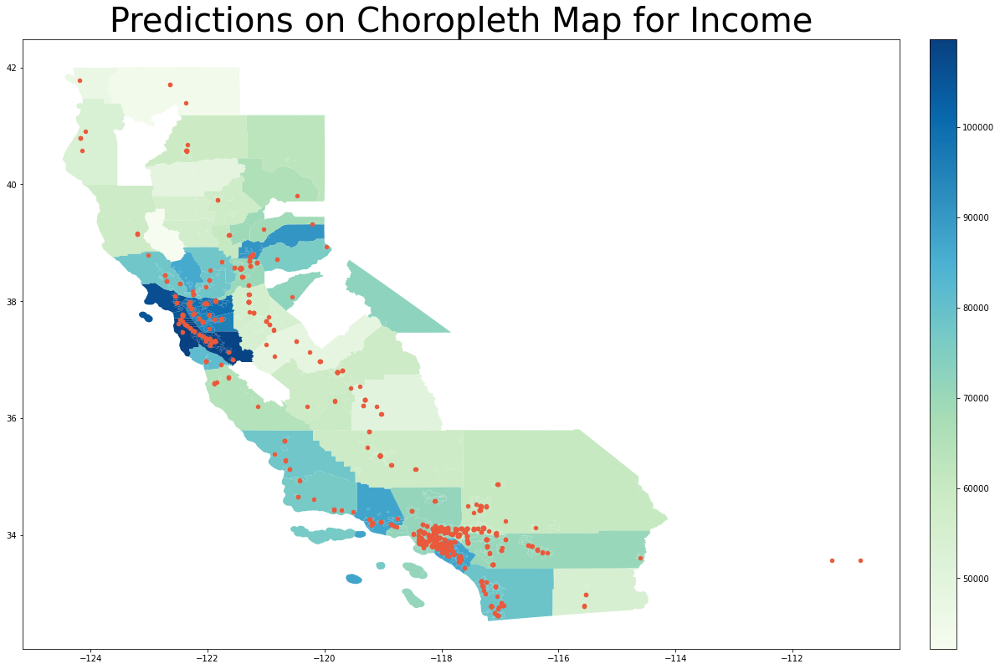

In [44]:
# Choropleth for income, overlayed with predicted locations
fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
ax.set_title('Predictions on Choropleth Map for Income', fontdict={'fontsize': '40', 'fontweight' : '5'})
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.5)
county_geo.plot(ax=ax, cax=cax, column='Median Household Income', cmap='GnBu', k = 6, legend=True)
predicted_geo.plot(ax=ax, marker='o', color='#EA593B', markersize=20)
plt.show();

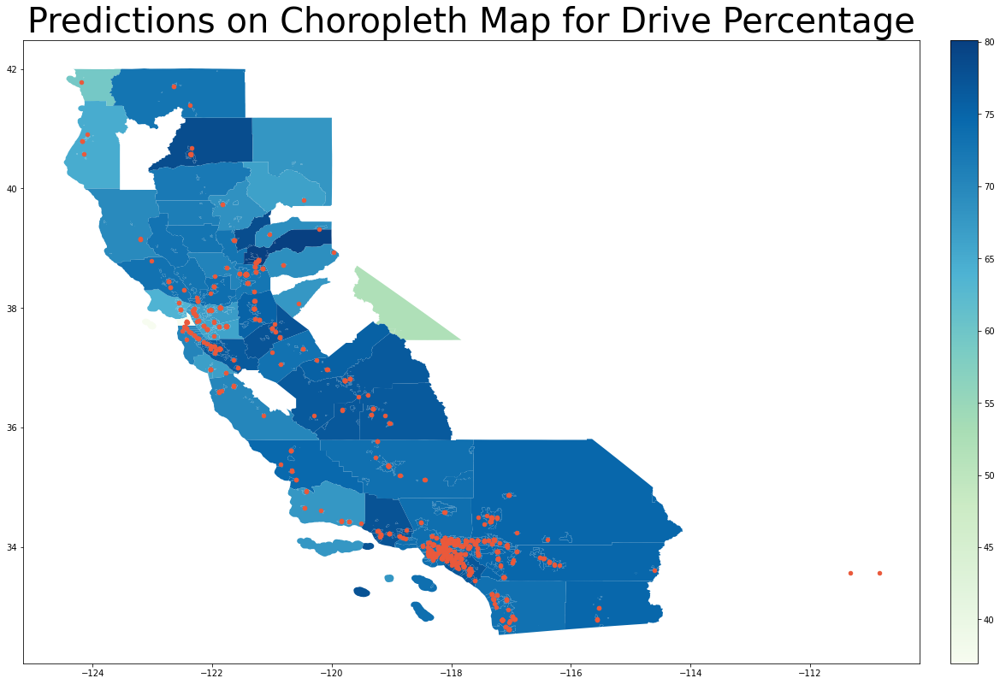

In [45]:
# Choropleth for drive percentage, overlayed with predicted locations
fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
ax.set_title('Predictions on Choropleth Map for Drive Percentage', fontdict={'fontsize': '40', 'fontweight' : '5'})
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.5)
county_geo.plot(ax=ax, cax=cax, column='Drive Percentage', cmap='GnBu', k = 6, legend=True)
predicted_geo.plot(ax=ax, marker='o', color='#EA593B', markersize=20)
plt.show();


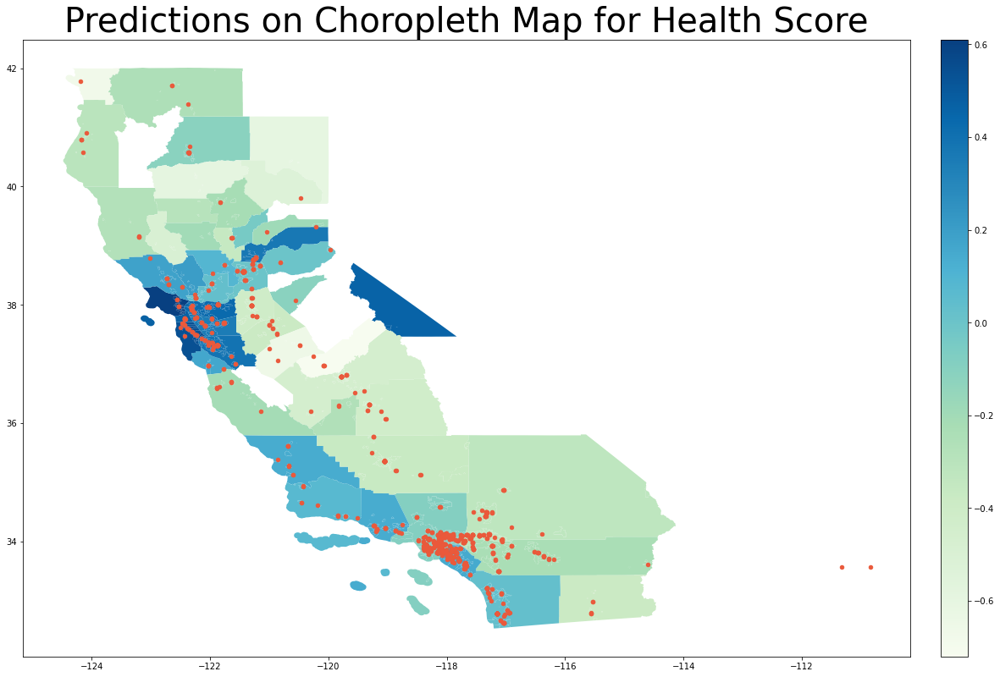

In [46]:
# Choropleth for health score, overlayed with predicted locations
fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
ax.set_title('Predictions on Choropleth Map for Health Score', fontdict={'fontsize': '40', 'fontweight' : '5'})
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.5)
county_geo.plot(ax=ax, cax=cax, column='Health Score', cmap='GnBu', k = 6, legend=True)
predicted_geo.plot(ax=ax, marker='o', color='#EA593B', markersize=20)
plt.show();

#### Training model differently
In the previous model, we used all three factors (median household income, drive percentage, and health score) as an input to generate our "ideal" fast food restaurant location. However, we see that our model produced scattering results. Instead, we now want to see if a single factor can be a good predictor of where fast food restaurants should open so we do a similar analysis from above.

In [47]:
def predict_income_location(training_set, prediction_set):
    """ Predicts a location for fast food restaurant to open based on median household income.
    
    Parameters
    ----------
    training_set: Pandas Dataframe
        The training set used for our model
    prediction_set: Pandas Dataframee
        The prediction set used to train our model
    
    Returns
    -------
    The longitude and latitude of the ideal location to open a fast food restaurant.
    """
    X = training_set[['Median Household Income']]
    y = training_set[['Latitude', 'Longitude']]
    model = DecisionTreeRegressor()
    model.fit(X, y)

    # Generate random predictor data
    predictor_index = random.randint(0,len(prediction_set) - 1)
    predictor_income = prediction_set.iloc[predictor_index]['Median Household Income']

    row = [predictor_income]

    yhat = model.predict([row])
    lat = yhat[0][0]
    long = yhat[0][1]

    return lat, long

In [48]:
def predict_drive_location(training_set, prediction_set):
    """ Predicts a location for fast food restaurant to open based on drive to work percentage.
    
    Parameters
    ----------
    training_set: Pandas Dataframe
        The training set used for our model
    prediction_set: Pandas Dataframee
        The prediction set used to train our model
    
    Returns
    -------
    The longitude and latitude of the ideal location to open a fast food restaurant.
    """
    X = training_set[['Drive Percentage']]
    y = training_set[['Latitude', 'Longitude']]
    model = DecisionTreeRegressor()
    model.fit(X, y)

    # Generate random predictor data
    predictor_index = random.randint(0,len(prediction_set) - 1)
    predictor_drive = prediction_set.iloc[predictor_index]['Drive Percentage']

    row = [predictor_drive]

    yhat = model.predict([row])
    lat = yhat[0][0]
    long = yhat[0][1]

    return lat, long

In [49]:
def predict_health_location(training_set, prediction_set):
    """ Predicts a location for fast food restaurant to open based on health index
    
    Parameters
    ----------
    training_set: Pandas Dataframe
        The training set used for our model
    prediction_set: Pandas Dataframee
        The prediction set used to train our model
    
    Returns
    -------
    The longitude and latitude of the ideal location to open a fast food restaurant.
    """
    X = training_set[['Health Score']]
    y = training_set[['Latitude', 'Longitude']]
    model = DecisionTreeRegressor()
    model.fit(X, y)

    # Generate random predictor data
    predictor_index = random.randint(0,len(prediction_set) - 1)
    predictor_health = prediction_set.iloc[predictor_index]['Health Score']

    row = [predictor_health]

    yhat = model.predict([row])
    lat = yhat[0][0]
    long = yhat[0][1]

    return lat, long

#### Running model 1000 times on each individual factor
Because our model is generating a latitude and longitude, we do not have an accuracy report. Instead, we run our model 1000 times to check its consistency for each factor. When we were predicting locations for each factor separately, we would use the same training and predictor data for all three models because we want it to be consistent.

In [50]:
income_locations = []
drive_locations = []
health_locations = []
for i in range(0,1000):
    training_set, prediction_set = split_set()
    income_lat, income_long = predict_income_location(training_set, prediction_set)
    drive_lat, drive_long = predict_drive_location(training_set, prediction_set)
    health_lat, health_long = predict_health_location(training_set, prediction_set
                                                     )
    income_coord = [income_lat, income_long]
    drive_coord = [drive_lat, drive_long]
    health_coord = [health_lat, health_long]
    
    income_locations.append(income_coord)
    drive_locations.append(drive_coord)
    health_locations.append(health_coord)

In [51]:
# Put data into dataframe for income variable
income_df = pd.DataFrame(columns=['Latitude','Longitude'])
for coordinate in income_locations:
    latitude = coordinate[0]
    longitude = coordinate[1]
    income_df = income_df.append({'Latitude':latitude, 'Longitude':longitude}, ignore_index=True)
    
income_df

,Latitude,Longitude
0,37.32,-122.03
1,37.79,-122.23
2,33.83,-117.93
3,33.96,-118.04
4,32.78,-117.15
...,...,...
995,36.82,-119.70
996,33.96,-118.03
997,33.86,-118.38
998,37.53,-121.98


In [52]:
# Predicted locations for median income variable
income_geo = gpd.GeoDataFrame(
    income_df, geometry=gpd.points_from_xy(income_df.Longitude, income_df.Latitude))
income_geo = income_geo.drop(columns=['Latitude','Longitude'])
income_geo

,geometry
0,POINT (-122.03299 37.32393)
1,POINT (-122.22854 37.78541)
2,POINT (-117.92557 33.82831)
3,POINT (-118.03607 33.95990)
4,POINT (-117.15363 32.77733)
...,...
995,POINT (-119.70353 36.82388)
996,POINT (-118.03047 33.95538)
997,POINT (-118.37694 33.85778)
998,POINT (-121.98103 37.53134)


#### Result from income choropleth map
In plotting our predicted locations from the results of the income model, we saw that income is not a good predictor for ideal fast food restaurant locations because the data was scattered and did not fall into a particular quantile zone in the choropleth map.

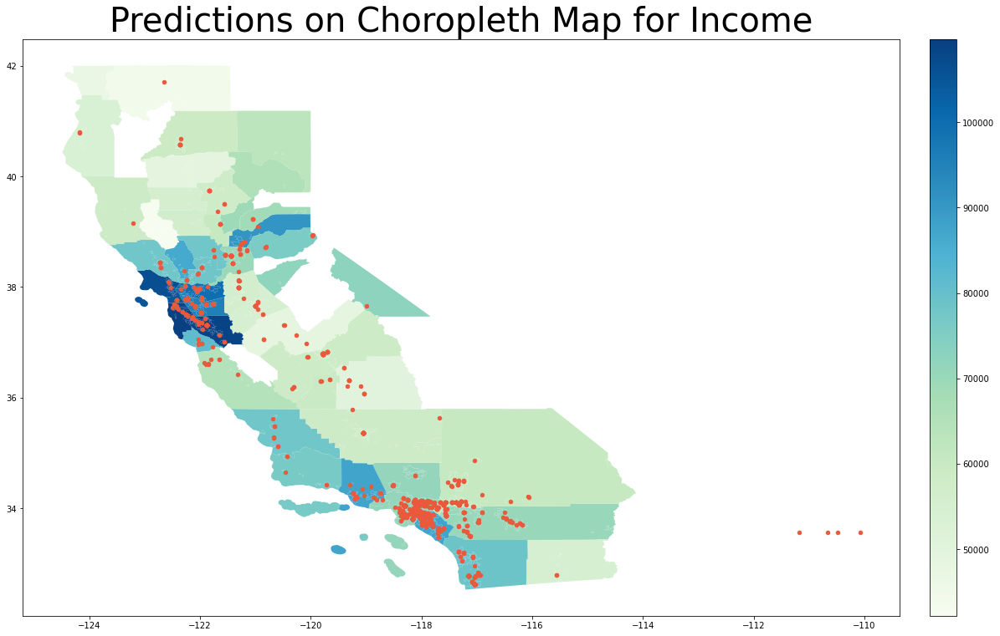

In [53]:
# Plotting our predicted locations for median income variable onto a choropleth map
fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
ax.set_title('Predictions on Choropleth Map for Income', fontdict={'fontsize': '40', 'fontweight' : '5'})
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.5)
county_geo.plot(ax=ax, cax=cax, column='Median Household Income', cmap='GnBu', k = 6, legend=True)
income_geo.plot(ax=ax, marker='o', color='#EA593B', markersize=20)
plt.show();

In [54]:
# Put data into dataframe for drive percentage variable
drive_df = pd.DataFrame(columns=['Latitude','Longitude'])
for coordinate in drive_locations:
    latitude = coordinate[0]
    longitude = coordinate[1]
    drive_df = drive_df.append({'Latitude':latitude, 'Longitude':longitude}, ignore_index=True)
    
drive_df

,Latitude,Longitude
0,34.20,-119.18
1,33.87,-117.56
2,36.33,-119.67
3,37.71,-122.15
4,33.21,-117.33
...,...,...
995,34.06,-117.60
996,34.28,-118.75
997,34.04,-118.30
998,33.89,-118.13


In [55]:
# Predicted locations for drive percentage variable
drive_geo = gpd.GeoDataFrame(
    drive_df, geometry=gpd.points_from_xy(drive_df.Longitude, drive_df.Latitude))
drive_geo = drive_geo.drop(columns=['Latitude','Longitude'])
drive_geo

,geometry
0,POINT (-119.18077 34.20188)
1,POINT (-117.55714 33.86692)
2,POINT (-119.66530 36.32914)
3,POINT (-122.14872 37.70905)
4,POINT (-117.32502 33.21153)
...,...
995,POINT (-117.59723 34.05781)
996,POINT (-118.74743 34.27621)
997,POINT (-118.30448 34.03997)
998,POINT (-118.12581 33.88503)


#### Result from drive percentage choropleth map¶
In plotting our predicted locations from the results of the drive percentage model, we saw that the drive percentage is not a good predictor for ideal fast food restaurant locations because the data was scattered and did not fall into a particular quantile zone in the choropleth map.

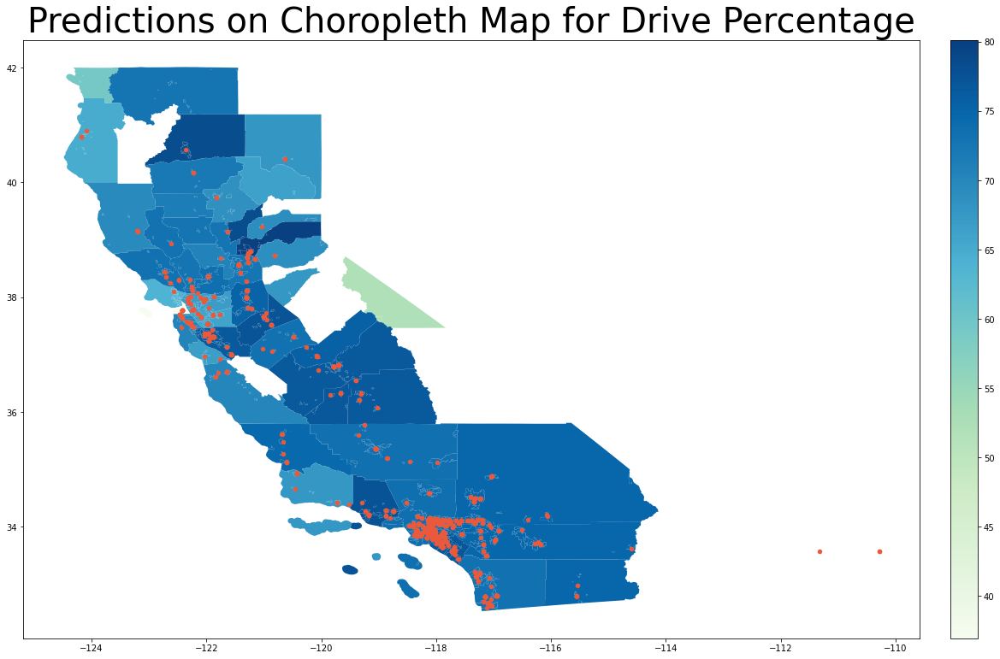

In [56]:
# Plotting our predicted locations for drive percentage variable onto a choropleth map
fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
ax.set_title('Predictions on Choropleth Map for Drive Percentage', fontdict={'fontsize': '40', 'fontweight' : '5'})
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.5)
county_geo.plot(ax=ax, cax=cax, column='Drive Percentage', cmap='GnBu', k = 6, legend=True)
drive_geo.plot(ax=ax, marker='o', color='#EA593B', markersize=20)
plt.show();

In [57]:
# Put our data into a dataframe
health_df = pd.DataFrame(columns=['Latitude','Longitude'])
for coordinate in health_locations:
    latitude = coordinate[0]
    longitude = coordinate[1]
    health_df = health_df.append({'Latitude':latitude, 'Longitude':longitude}, ignore_index=True)
    
health_df

,Latitude,Longitude
0,34.05,-118.04
1,38.60,-121.28
2,34.43,-119.72
3,33.89,-118.30
4,38.57,-121.44
...,...,...
995,36.79,-119.79
996,33.81,-118.16
997,33.88,-117.79
998,33.75,-116.98


In [58]:
# Predicted locations for health score variable
health_geo = gpd.GeoDataFrame(
    health_df, geometry=gpd.points_from_xy(health_df.Longitude, health_df.Latitude))
health_geo = health_geo.drop(columns=['Latitude','Longitude'])
health_geo

,geometry
0,POINT (-118.04035 34.04747)
1,POINT (-121.27796 38.60200)
2,POINT (-119.72479 34.42866)
3,POINT (-118.30117 33.89204)
4,POINT (-121.43658 38.56654)
...,...
995,POINT (-119.78754 36.79199)
996,POINT (-118.15842 33.80962)
997,POINT (-117.78753 33.88289)
998,POINT (-116.97891 33.74546)


#### Result from health score choropleth map
In plotting our predicted locations from the results of the health score model, we saw that health score is not a good predictor for ideal fast food restaurant locations because the data was scattered and did not fall into a particular quantile zone in the choropleth map.

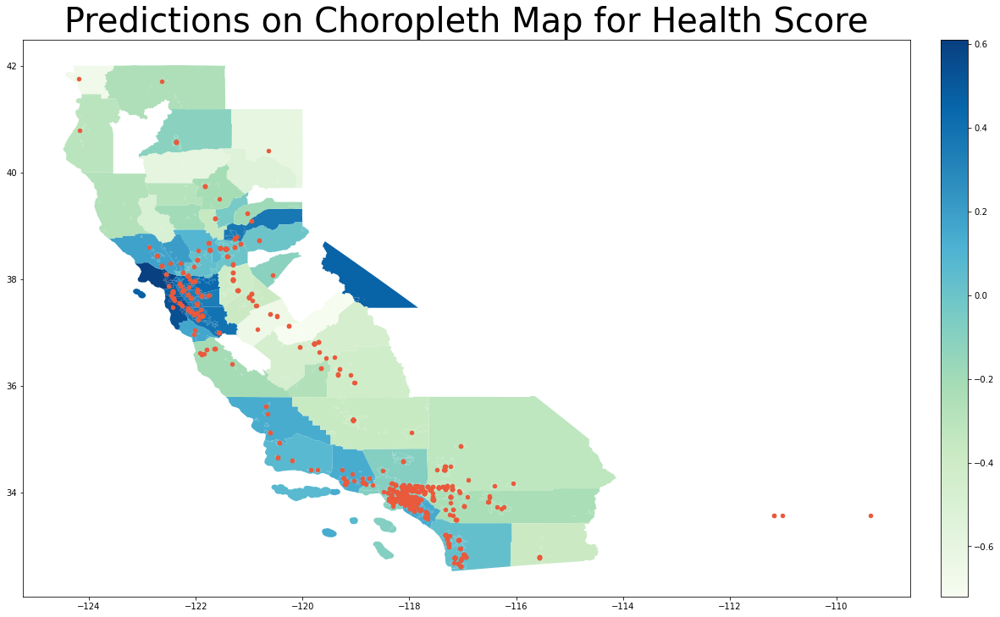

In [59]:
# Plotting our predicted locations for health score variable onto a choropleth map
fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
ax.set_title('Predictions on Choropleth Map for Health Score', fontdict={'fontsize': '40', 'fontweight' : '5'})
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.5)
county_geo.plot(ax=ax, cax=cax, column='Health Score', cmap='GnBu', k = 6, legend=True)
health_geo.plot(ax=ax, marker='o', color='#EA593B', markersize=20)
plt.show();

## Results from Analysis
We first trained our model based on three factors (median household income, drive percentage, and health score) and we arrived to the conclusion that the three factors were not very good predictors of fast food locations since the results were scattered all over the place. This led us to try a different approach where instead of relying on all three factors as inputs to our model, we tested each factor individually. Again, we still arrived to the same conclusion that these factors were not great predictors for ideal locations to open fast food restaurants. However, it is important to note that our model may not be accurate given there were some locations generated outside of California.

# Ethics & Privacy

The datasets we used in the project were all publicly available on the Internet and did not have any compromising information like names, ages, IDs, and so on. We web scraped data from Wikipedia (city names and populations) and Yelp (fast food restaurants and their locations), so it is possible that there is bias because there could be some restaurants left out, but we did attempt to check for every city according to the list from Wikipedia. There may also be a bias because we are only considering California, but for the most part, we do not believe the data we are using excludes any particular demographics within the state. 

Our question aims to determine the ideal location for a fast food restaurant to open up based on health index, median income, and the percentage of people who drive a car to work. The model can be used to give recommendations to fast food companies and see whether the prediction is a good location. However, an ethical concern could be that it is used to target certain communities. For example, they may target those with lower income because fast food is cheap and convenient. Although this does seem like an issue, as mentioned in our background, there have been studies that show that while people living in poorer neighborhoods have greater exposure to fast food, they were less likely to eat fast food than the middle class and not much more likely than the upper class. It is probable that companies already know this, and would therefore be more inclined to spread out their locations so that it is accessible to those who would consume them.



# Conclusion & Discussion

At the start of our project, we wanted to find out whether or not income, health index, and the percentage of people who drive to work were determining factors in an ideal fast food restaurant location. We used a multi-output regression model to predict a latitude and longitude given the income, health index, and drive percentage. We then plotted these outputted locations overlayed on a choropleth map for each of the three factors to compare how well the model was working. 

Our analysis shows that there is not much correlation between these three variables because the points are scattered across California with a bit of clustering around San Francisco and Los Angeles. However, it is likely that the clustering is caused by a confounding factor, such as population density, and not our factors, so we could not say for certain that income, health index, and the percentage of people who drive to work were affecting fast food locations. We also tried to test each of the factors on its own to see if there was any factor that had a stronger correlation to where fast food restaurants opened their businesses. Our graphs ended up with a similar distribution to the one where we tested all three of the factors together so we concluded that we had to reject our hypothesis and say that a lower income, greater drive to work percentage, and lower health score do not help us predict an ideal location for a fast food restaurant.

This analysis was limited by a lot of missing information alongside troubles with obtaining all of the necessary data we needed from the Yelp API. In working with the Yelp API, we had to set a specific radius when gathering the fast food restaurants of this city, but there were limitations to this as there was a maximum radius cap that prevented us from accurately obtaining all the fast food restaurants within a city. The Yelp dataset also does not include restaurants where there are no reviews, so this may be a contributing factor to errors within our dataset. A lot of our datasets also had information from the 2010 Census Bureau, which could be outdated. The Census Bureau also excluded information from cities in which their population size was less than five thousand, resulting in cities that were missing from the census’s data. Thus, we had to perform webscraping from another census source to obtain said information, which could result in inaccuracies or bias due to different data sources. In cases where we could not find replacements for missing information, we had to exclude such cities from our data. 

Originally, our goal was to create a model that could recommend an ideal location for a fast food restaurant to open up. There was an ethical concern, as mentioned above, that the model could be used to target specific communities, such as lower-income neighborhoods or areas with low health index scores, however, it can still serve as an informative guide for fast food industries that are interested in how these factors might or might not play a role in the success of a restaurant. 


# Team Contributions

- Kathy Quach: overview, background & prior work, set up and cleaning of Driving Percent data, data analysis, EDA, ethics & privacy, conclusion
- Jill Su: set up and cleaning of Health Score data, data analysis, EDA, conclusion
- Vivian Tang: set up and cleaning of Median Income data, data analysis, EDA
- Victor Ung: set up and cleaning of Yelp API Restaurants data, data analysis, EDA
